# Chapter 6: Importing, Cleaning, and Analyzing Data

## Working with Data

| New Concepts | Description |
| --- | --- |
| _pandas_ methods (more) | *pd.read_excel()*, *pd.to_numeric()*, *pd.to_csv()* |

We live in the age of data. With a little bit of searching and some idea of what you would like to investigate, you will be able to find data online. In the following exercise we will use data from the Index of Economic Freedom. Visit their [downloads page](http://www.heritage.org/index/download).

Under the section titled 2017 Index of Economic Freedom, click the button titled Download Raw Data.

<img src="https://raw.githubusercontent.com/jlcatonjr/Learn-Python-for-Stats-and-Econ/master/2017IndexOfEconomicFreedomDownloadPage.png" alt="Heritage Economic Freedom Download Page" title="Figure 6.1" />
<h3><center>Figure 6.1</center></h3>

Download it to the same folder in which you have saved the py files that you are using this chapter. Save the data as an .xls file.

*The column heading for "Judicial Effectiveness" has been mispelled as "Judical Effectiveness". Make sure to correct this before saving and closing the file.*


Once you have saved it, we will import the data using pandas library. We use DataFrame() frame function to build a data frame. Using from_csv we are able to import the csv as a data frame. This automatically imports the data using the elements that comprise the header as keys. The data frame works like a dictionary, but is structured like a spreadsheet when printed. The pandas library also has a number of functions that allows you to manipulate data contained in a data frame or series. We also import several other libraries, as well as stats – the stats.py file we saved in the same folder – as we will use these later. 

In [1]:
#economicFreedomStats.py
import pandas as pd
import stats

data = pd.read_excel("index2017_data.xlsx", index_col = [1])

If you use shape, you can check the number of rows and columns:

In [2]:
data.shape

(186, 33)

Now that we have imported data, we need to clean the data. It is impossible to teach the basics of cleaning data in a short section. Your ability to clean data is dependent upon your ability to find solutions on the spot. This requires practice. Almost any data that you import will need to be cleaned. There will be missing values, string characters, etc… 

We will start by removing columns with data that will not be useful for this exercise. And we will only included row (i.e., countries) with data for every column. First, let's check the names of the DataFrame columns in the console. Enter:

In [3]:
data.keys()

Index(['CountryID', 'WEBNAME', 'Region', 'World Rank', 'Region Rank',
       '2017 Score', 'Property Rights', 'Judicial Effectiveness',
       'Government Integrity', 'Tax Burden', 'Gov't Spending', 'Fiscal Health',
       'Business Freedom', 'Labor Freedom', 'Monetary Freedom',
       'Trade Freedom', 'Investment Freedom ', 'Financial Freedom',
       'Tariff Rate (%)', 'Income Tax Rate (%)', 'Corporate Tax Rate (%)',
       'Tax Burden % of GDP', 'Gov't Expenditure % of GDP ', 'Country',
       'Population (Millions)', 'GDP (Billions, PPP)', 'GDP Growth Rate (%)',
       '5 Year GDP Growth Rate (%)', 'GDP per Capita (PPP)',
       'Unemployment (%)', 'Inflation (%)', 'FDI Inflow (Millions)',
       'Public Debt (% of GDP)'],
      dtype='object')

Or:

In [4]:
data.columns

Index(['CountryID', 'WEBNAME', 'Region', 'World Rank', 'Region Rank',
       '2017 Score', 'Property Rights', 'Judicial Effectiveness',
       'Government Integrity', 'Tax Burden', 'Gov't Spending', 'Fiscal Health',
       'Business Freedom', 'Labor Freedom', 'Monetary Freedom',
       'Trade Freedom', 'Investment Freedom ', 'Financial Freedom',
       'Tariff Rate (%)', 'Income Tax Rate (%)', 'Corporate Tax Rate (%)',
       'Tax Burden % of GDP', 'Gov't Expenditure % of GDP ', 'Country',
       'Population (Millions)', 'GDP (Billions, PPP)', 'GDP Growth Rate (%)',
       '5 Year GDP Growth Rate (%)', 'GDP per Capita (PPP)',
       'Unemployment (%)', 'Inflation (%)', 'FDI Inflow (Millions)',
       'Public Debt (% of GDP)'],
      dtype='object')

We will remove the _"CountryID"_, _"Region"_, _"WEBNAME"_, and _"Country"_ columns.

In [5]:
#economicFreedomStats.py
# . . .

# some columns are not needed for the purposes of this exercise
# we will drop these columns
skip_keys = ["CountryID", "Region", "WEBNAME", "Country"]
data_for_stats = data.drop(skip_keys, axis = 1)
# Drop rows that do not include observation for every category
data_for_stats = data_for_stats.dropna(thresh = len(data_for_stats.keys()))

Let's check the columns again

Now the data is cleaned and ready to process. In the next chapter, we will compile regression statistics. For now, we will use the classes we created in the previous chapter to compile statistics. We will make three dictionaries. One dictionary will hold summary statistics that can be derived using only one variable. The other statistics that require two variables, correlation and covariance, will use separate dictionaries. We will use an instance of _Stats()_ to fill these dictionaries with summary statistics.

In [6]:
#economicFreedomStats.py
# . . . 

#Next we create dictionaries that will hold statistics for each variable
# or pair of variables in the case of cov and corr. Once complete,
# we will transform these into DataFrames
stat = stats.stats()
stats_dict = {}
cov_dict = {}
corr_dict = {}

You created an instance of stats()


We are ready to fill the dictionaries with summary statistics. We will use two for-loops. The first for-loop will be used to fill the *stats_dict* with summary statistics requiring only one variable. The second for-loop, which is within the first for-loop, is used to create the corrDict and cov_dict. These latter two dictionaries are each a dictionary of dictionaries. These are called by entering the two variables whose correlation or covariance you would like to see. For example, if you enter *cov_dict[“2017 Score”][“Property Rights”]* after *cov_dict* has been constructed, this will call the covariance of these two variables. The two for-loops cycle through listof variables, thus calling every combination of variables (twice) to create a matrix of covariance and correlation values.

In [7]:
#economicFreedomStats.py
# . . . 

for key1 in data_for_stats:
    vec1 = data_for_stats[key1]
    stats_dict[key1] = {}
    stats_dict[key1]["mean"] = stat.mean(vec1)
    stats_dict[key1]["median"] = stat.median(vec1)
    stats_dict[key1]["variance"] = stat.variance(vec1)
    stats_dict[key1]["standard deviation"] = stat.SD(vec1, sample = True)
    stats_dict[key1]["skewness"] = stat.skewness(vec1, sample = True)
    stats_dict[key1]["kurtosis"] = stat.kurtosis(vec1, sample = True)
    cov_dict[key1] = {}
    corr_dict[key1] = {}
    for key2 in data_for_stats:
        vec2 = data_for_stats[key2]
        cov_dict[key1][key2] =stat.covariance(vec1, vec2, sample = True)
        corr_dict[key1][key2] = stat.correlation(vec1, vec2)

Finally, if we want to see these tables in a convenient format (i.e., Figure 6.2), we need to export the dictionaries to a csv. First, we convert the dictionaries into pandas data frames using _pd.DataFrame()_. Once the data frames are created, use the command *dataframe.to_csv(path)* to create csv files in the desired location. In line 61, we also save a csv of the cleaned data for use in the next section. 

In [8]:
#economicFreedomStats.py
# . . . 

#convert stats, cov, and corr dictionaries to pandas DataFrames
stats_DF = pd.DataFrame(stats_dict)
cov_DF = pd.DataFrame(cov_dict).sort_index(axis = 1)
corr_DF = pd.DataFrame(corr_dict).sort_index(axis = 1)

#output DataFrames to CSV
stats_DF.to_csv("econFreedomStats.csv")
cov_DF.to_csv("econFreedomCovMatrix.csv")
corr_DF.to_csv("econFreedomCorrMatrix.csv")
data_for_stats.to_csv("cleanedEconFreedomData.csv")

<img src="https://github.com/jlcatonjr/Learn-Python-for-Stats-and-Econ/blob/master/correlationMatrix.png?raw=true" alt="Correlation Matrix in CSV Format" title="Figure 6.2" />
<h3><center>Figure 6.2</center></h3>


## Visualizing Data

| New Concepts | Description |
| --- | --- |
| _matplotlib_ (more) | _PdfPages()_, _plt.subplots()_, _plt.xticks()_, _plt.setp()_, _fig.colorbar()_, _ax.imshow()_, *plt.tight_layout()* | 
| _Pandas_ methods | *pd.plotting.scatter_matrix* |

Next we will visualize the data. We will create scatterplots that use color to indicate a 3rd dimension. Then we wil create a heatmap that visualizes a subset of the correlation matrix. Finally, we will create a single figure that shows the scatter plots of each pair of this subset and the distribution of each variable along the diagonal of the figure.

Most of the images created in this exercise will be saved in a single PDF, with one image on each page. We do this by calling PdfPages, which is imported from matplotlib.backends.backend_pdf. Each image will be saved as an object, fig, and that object will be passed to the savefig method from this library.

In preparation for creating these images, the default fontsize is set to 24 and a subset of variables is chosen to be represented. If you prefer, you may add to or change this list. Keep in mind that changes in the dimension of the latter two types of visulizations may affect the formatting.

In [9]:
#econFreedomVisualization.py
import pandas as pd

data = pd.read_csv("cleanedEconFreedomData.csv", index_col = ["Country Name"])
scatter_cats = ["World Rank", "2017 Score", "Property Rights",
               "Judicial Effectiveness", "5 Year GDP Growth Rate (%)",
               "GDP per Capita (PPP)"]
select_data = data[scatter_cats]

### Scatter Plots

By cycling through the same list of keys 3 times, we are able to create scatter plots that represent different sets of variables. The if statements prevent the creation of plots that use the same variable on more than one axis. (How would you prevent the same pair of variables appearing on the x and y and vice versa?) Plots are created for every set of variables in the dataframe. 

When creating a visualization, the script may identify the attributes of text, the axes, the dimensions of the visualization, and so forth. The primary method, .plot.scatter(), also includes a parameter, alpha, that selects the level of transparancy (from most transparent, 0, to least transparent, 1). The colormap setting chosen is *“viridis”*. If you prefer a different color setting, you can check matplotlib's [list of colormaps](https://matplotlib.org/users/colormaps.html).  

Finally, the program identifies the figure to be used by passing _ax = ax_ to _DataFrame.plot.scatter()_. This will save to the appropriate figure axis. The figure, _fig_, will be passed to the PdfPages variable.

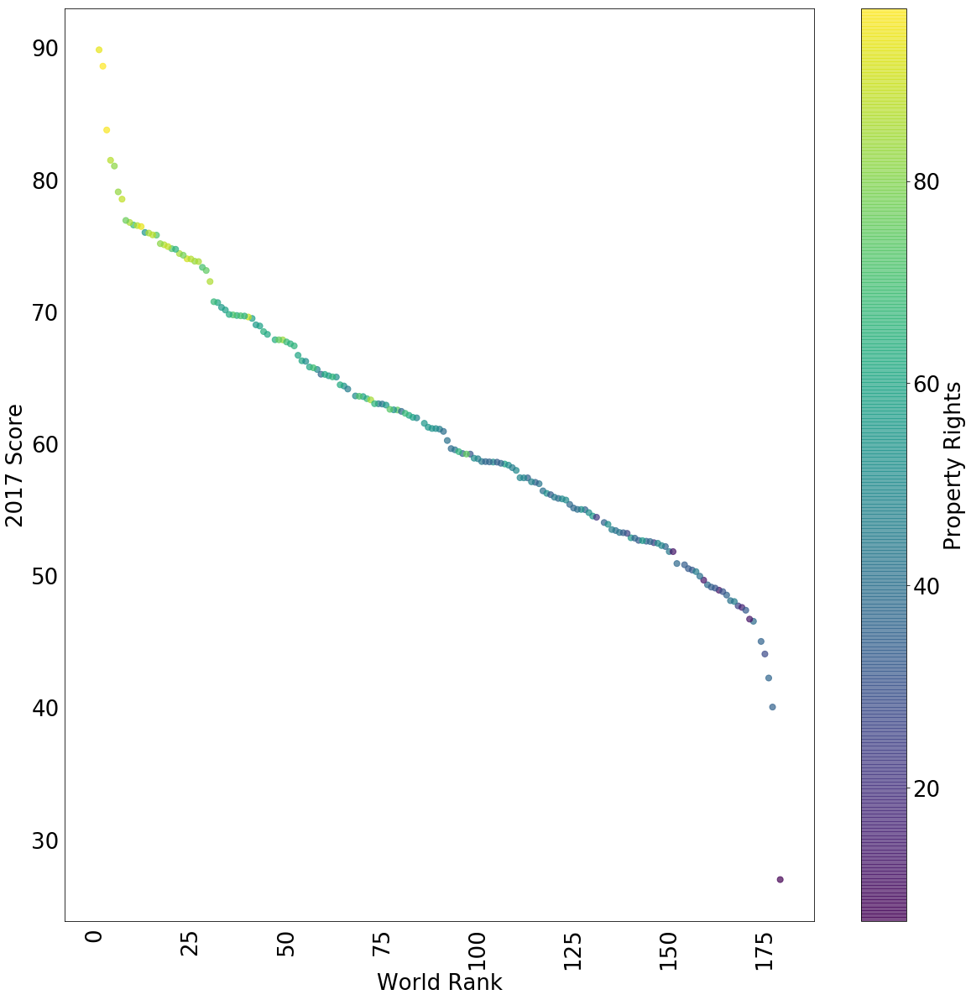

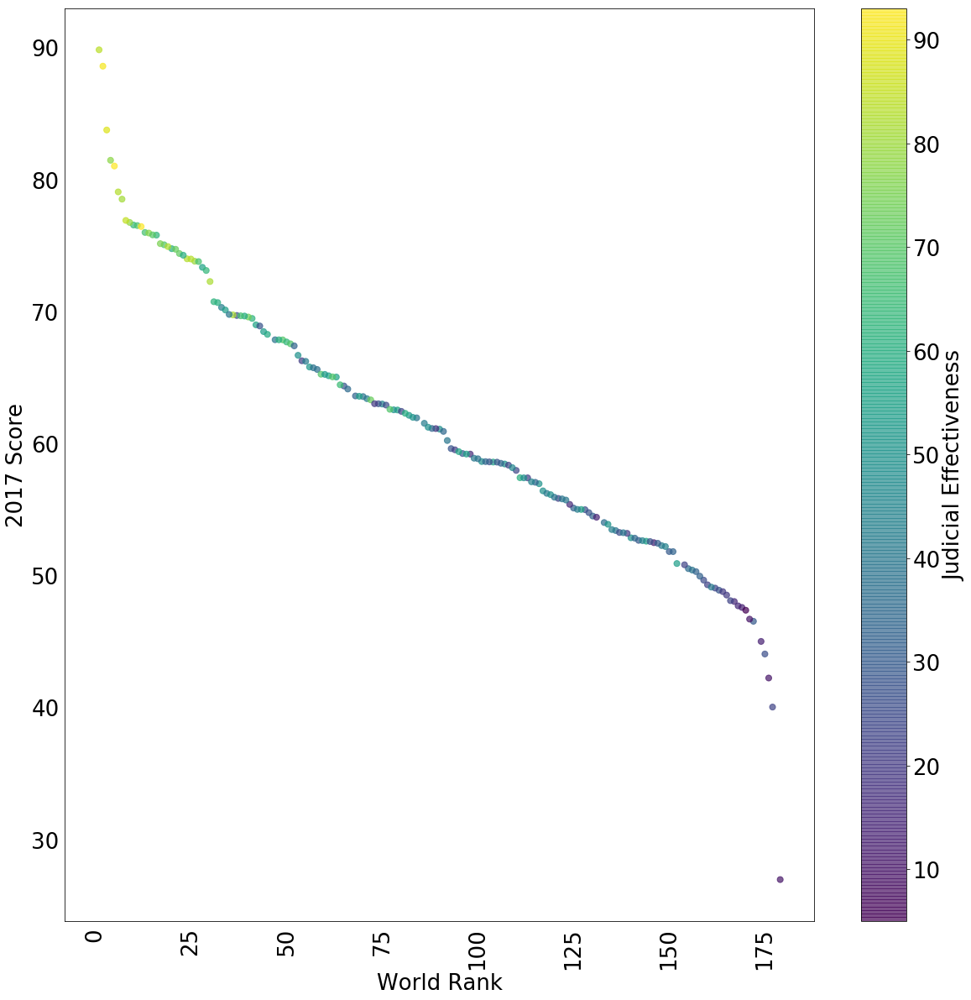

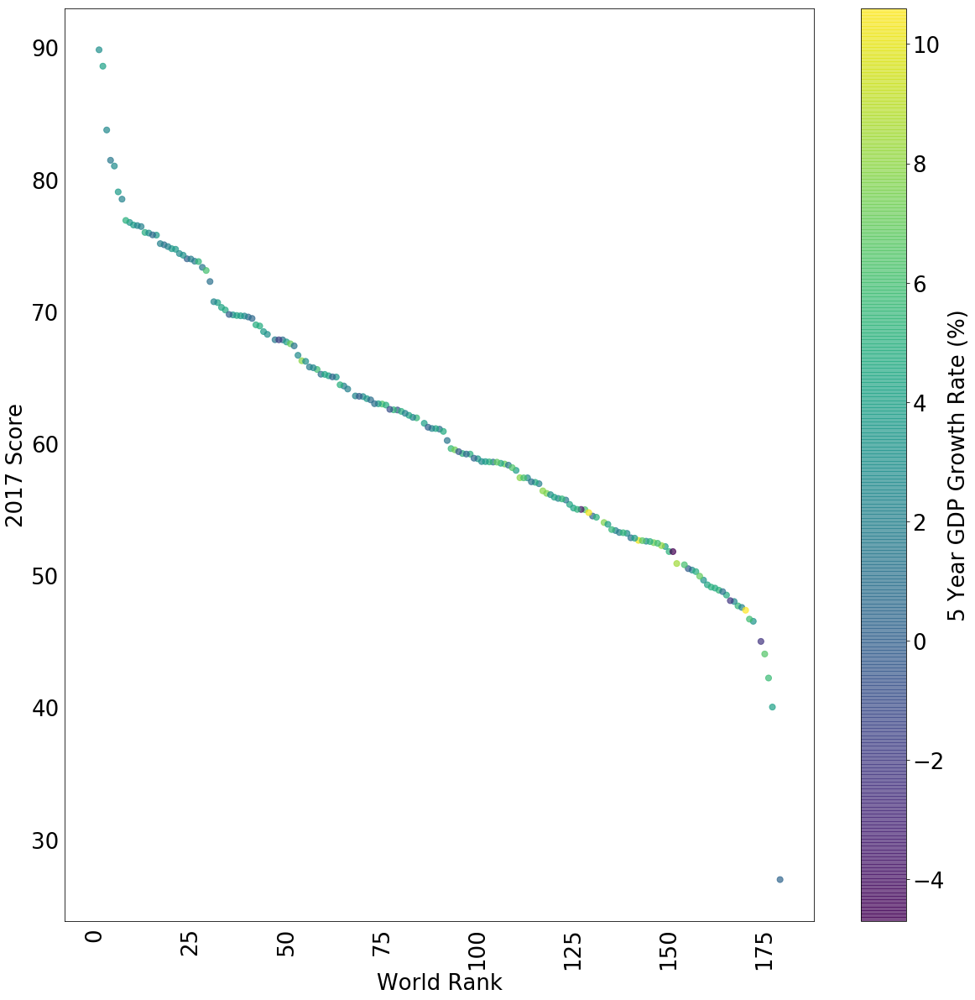

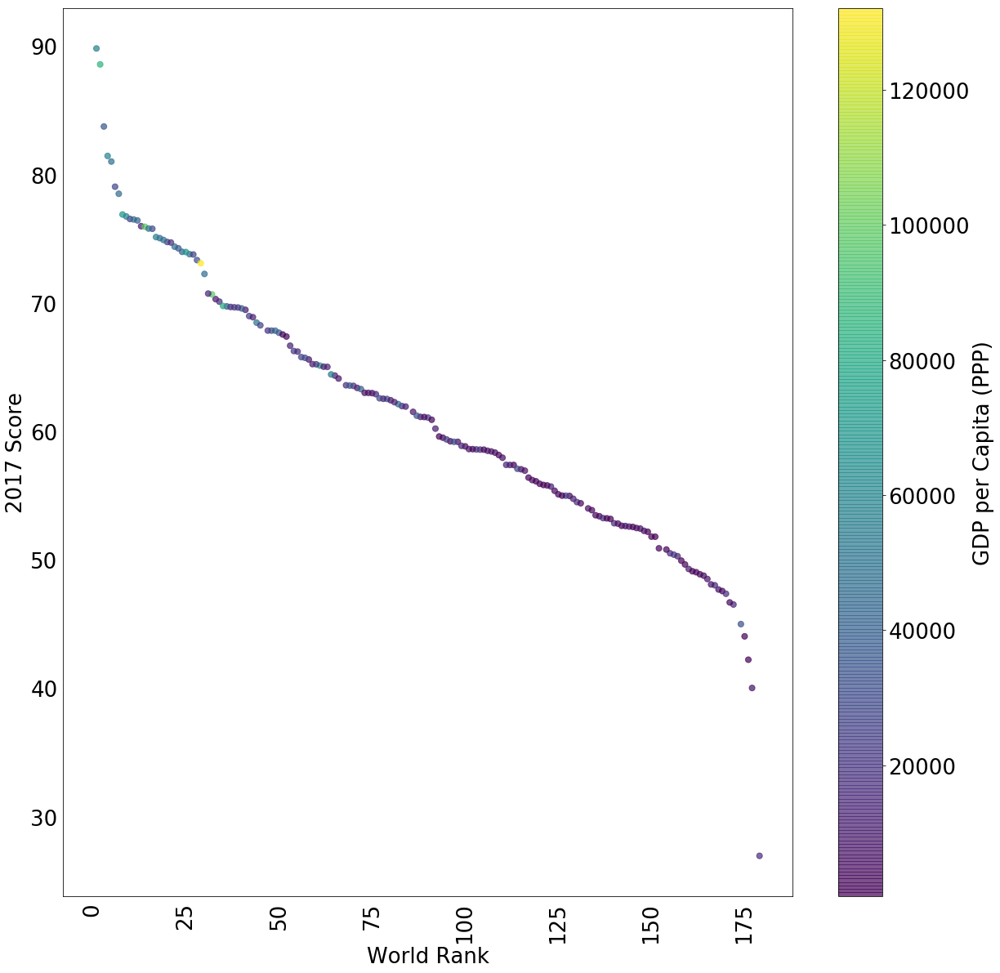

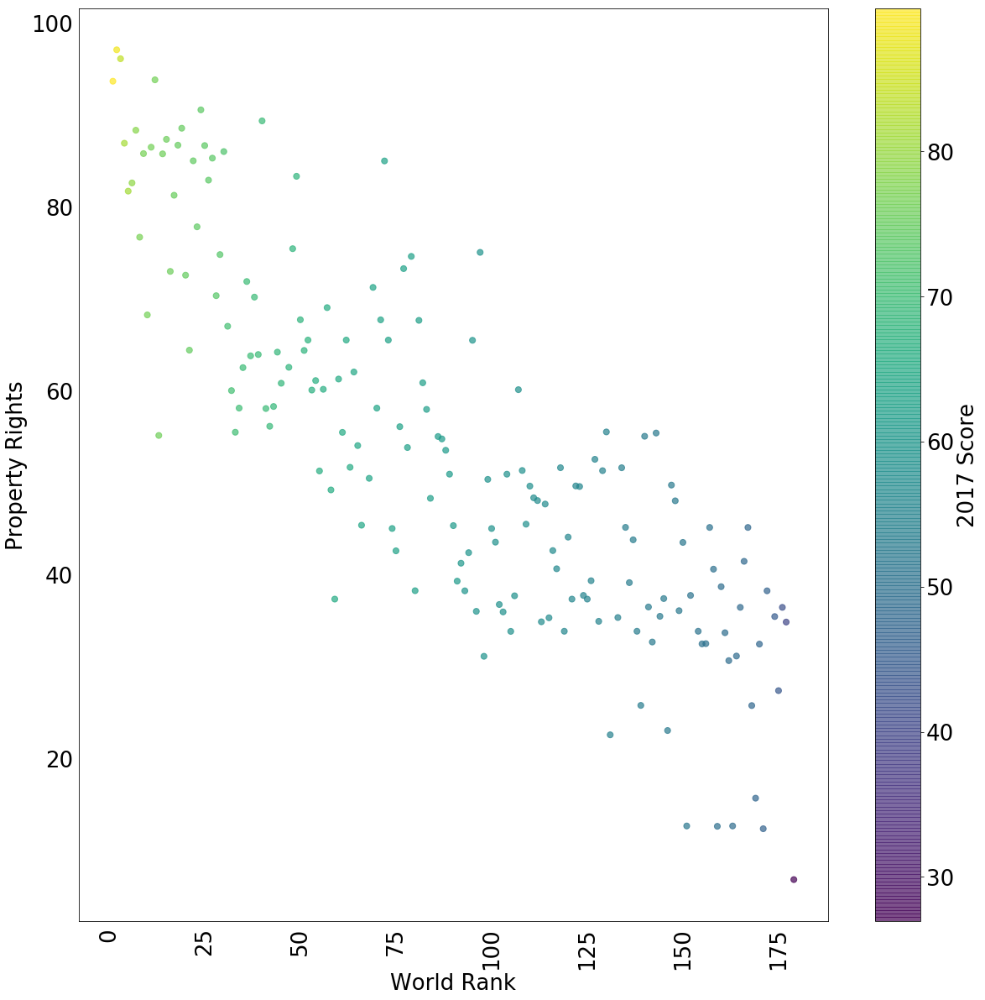

...

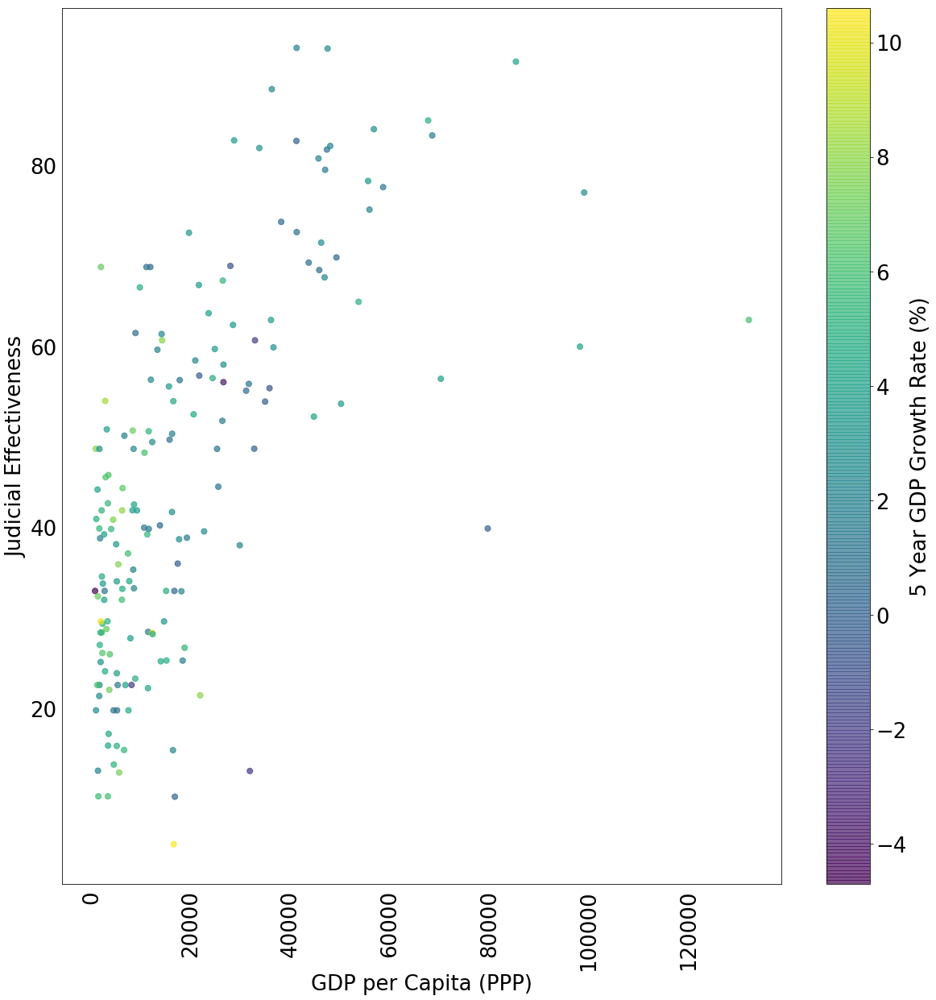

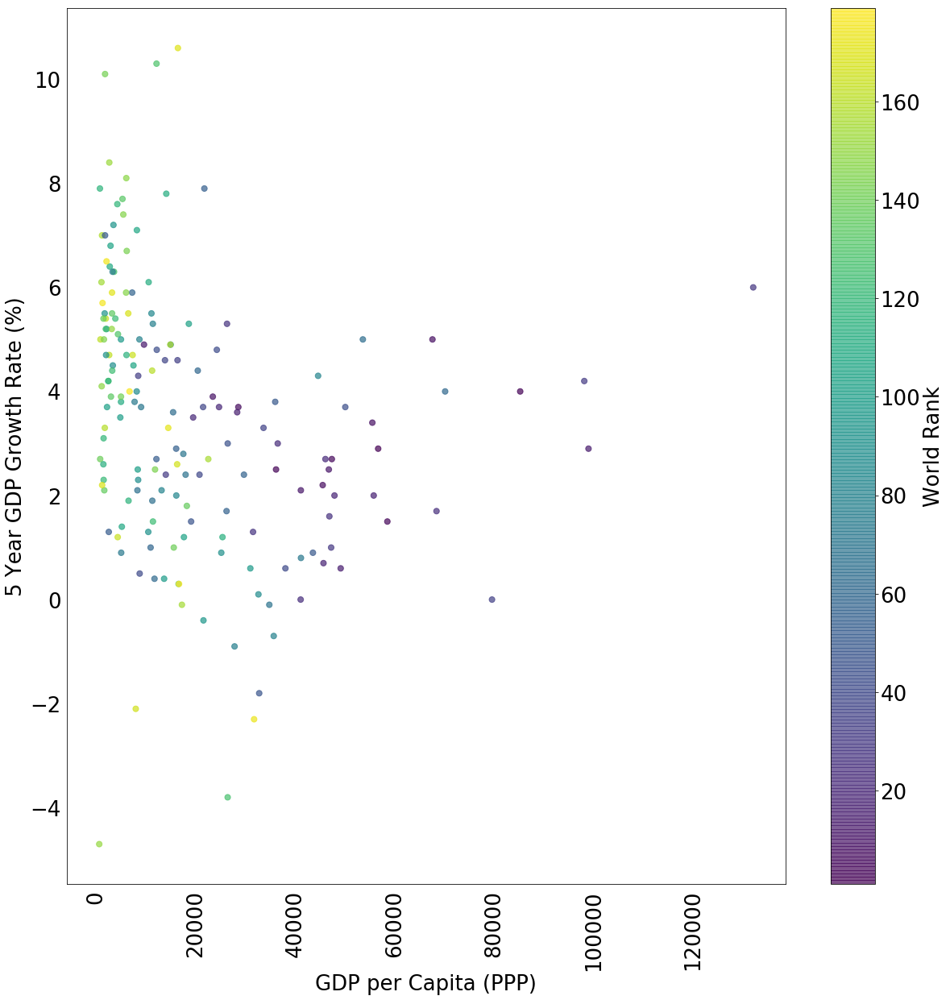

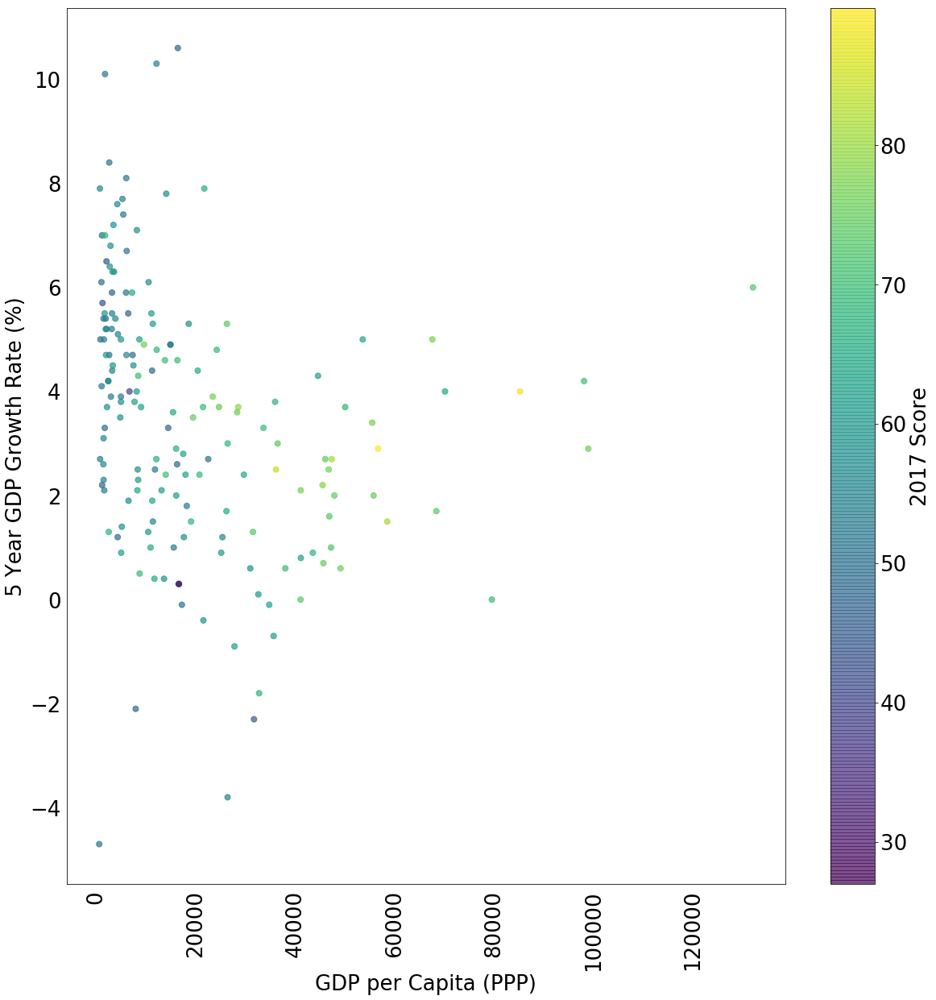

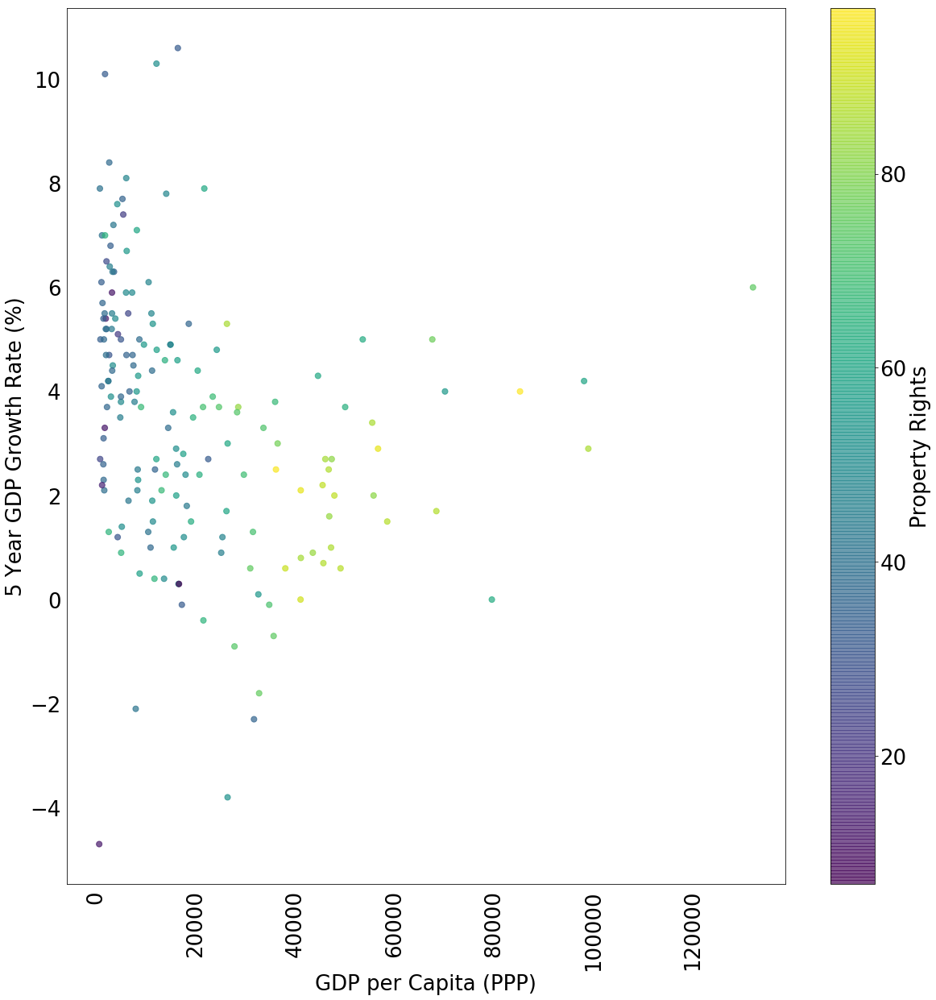

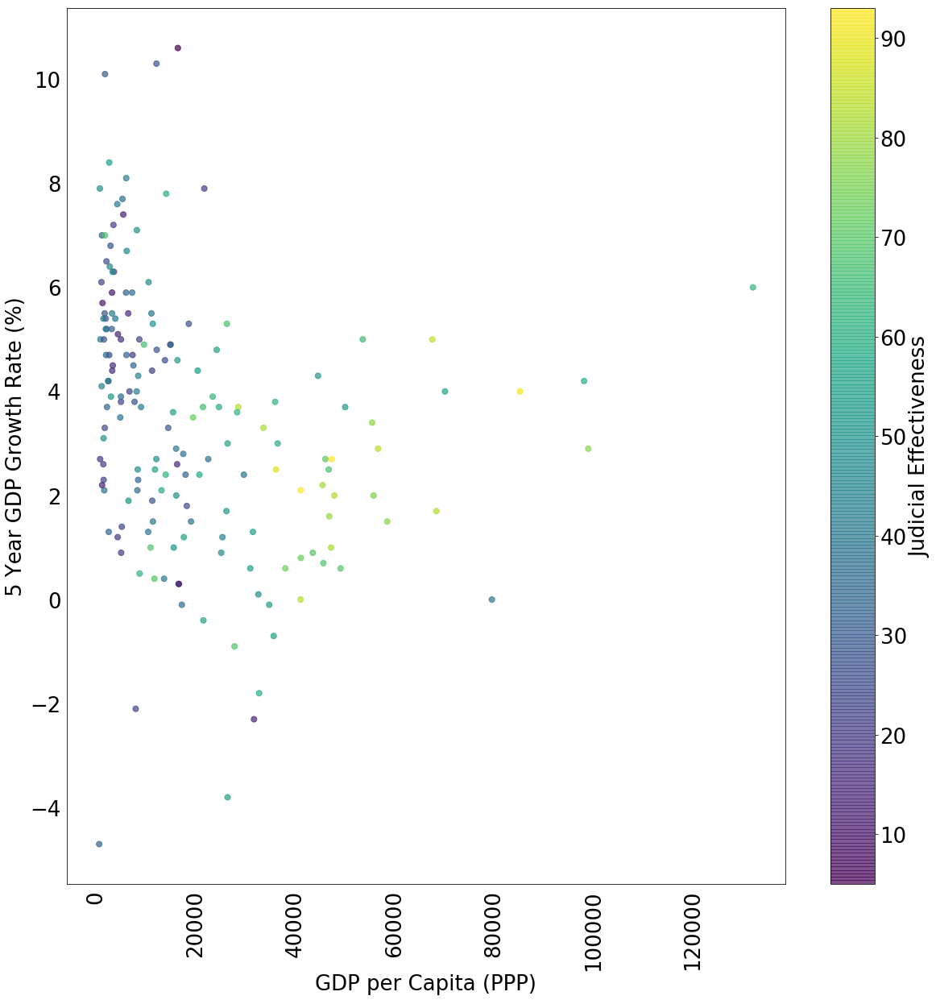

In [13]:
#econFreedomVisualization
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

def color_dim_scatter(data, pp):  
    # function uses color as dimension in scatter plot  
    for key1 in data:  
        for key2 in data:  
            # do not use same variable for x and y dimension  
            if key1 != key2:  
                for key3 in data:  
                    # do not create visualization if key1 or key2  
                    # equals key3  
                    if key1 != key3 and key2 != key3:  
                        # Choose figure size and save ax as object  
                        fig, ax = plt.subplots(figsize = (20, 20))  
                        # each point represents an observation with 3 different  
                        # values: key1 on the horiz ax, key2 on the vert ax,   
                        # and key3 as color  
                        data.plot.scatter(x = key1, y = key2, c = key3, s = 50,  
                                          alpha = .7, colormap = "viridis",  
                                          ax = ax)  
                        # Make values on x-axis vertical  
                        plt.xticks(rotation = 90)  
                        # Remove tick lines  
                        plt.setp(ax.get_xticklines(), visible = False)  
                        plt.setp(ax.get_yticklines(), visible = False)  
                        plt.show()  
                        pp.savefig(fig, bbox_inches = "tight")  
                        plt.close()  
# . . .
# Save plots in a pdf using PdfPages
pp = PdfPages("Economic Freedom Plots.pdf")
# set default size of font in figures
plt.rcParams.update({"font.size" : 26})
# select subset of variables ot visualize in scatter plot
color_dim_scatter(select_data, pp)

### Correlation Heatmap

Next, we will create a heatmap that shows represents the correlation matrix. This is a relatively straightforward task since we have already organized the data is it will appear in this heatmap. We create another figure using plt.subplots(). The ax variable is used to call imshow, ax.imshow(df), which is creates the heatmap. The labels, however, are not automatically generated. We create a variable that holds the labels and pass, along with an empty list of the same length to plt.xticks() and plt.yticks(). Passing the title “Correlation” to plt.title() generates a title at the top of the plot.

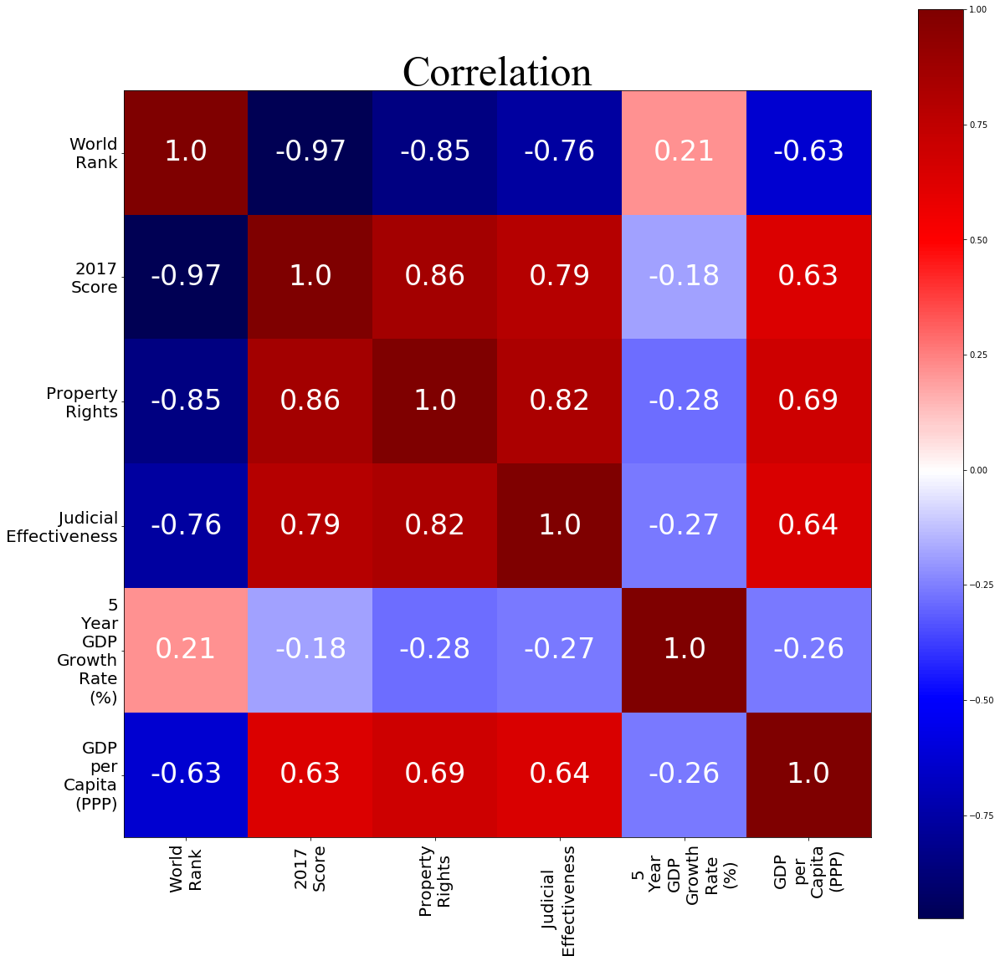

In [11]:
#econFreedomVisualizations.py
import numpy as np
# . . .
def corr_matrix_heatmap(data, pp):  
    #Create a figure to visualize a corr matrix  
    fig, ax = plt.subplots(figsize=(20,20))  
    # use ax.imshow() to create a heatmap of correlation values  
    # seismic mapping shows negative values as blue and positive values as red  
    im = ax.imshow(data, cmap = "seismic")  
    # create a list of labels, stacking each word in a label by replacing " "  
    # with "\n"  
    labels = data.keys()  
    num_vars = len(labels)  
    tick_labels = [lab.replace(" ", "\n") for lab in labels]  
    # adjust font size according to the number of variables visualized  
    tick_font_size = 120 / num_vars  
    val_font_size = 200 / num_vars  
    # prepare space for label of each column  
    x_ticks = np.arange(num_vars)  
    # select labels and rotate them 90 degrees so that they are vertical  
    plt.xticks(x_ticks, tick_labels, fontsize = tick_font_size, rotation = 90)  
    # prepare space for label of each row  
    y_ticks = np.arange(len(labels))  
    # select labels  
    plt.yticks(y_ticks, tick_labels, fontsize = tick_font_size)  
    # show values in each tile of the heatmap  
    for i in range(len(labels)):  
        for j in range(len(labels)):  
            text = ax.text(i, j, str(round(data.values[i][j],2)),  
                           fontsize= val_font_size, ha="center",   
                           va="center", color = "w")  
    #Create title with Times New Roman Font  
    title_font = {"fontname":"Times New Roman"}  
    plt.title("Correlation", fontsize = 50, **title_font)  
    #Call scale to show value of colors  
    cbar = fig.colorbar(im)
    cbar.set_clim(-1,1)
    plt.show()
    pp.savefig(fig, bbox_inches="tight")
    plt.close()

#. . . 
# . . .
corr_data = pd.read_csv("econFreedomCorrMatrix.csv", index_col = [0])
select_corr_data = corr_data.loc[scatter_cats][scatter_cats]
corr_matrix_heatmap(select_corr_data, pp)


The resulting heatmap provides a powerful presentation of the data. Both the actual value of correlation and the color are shown in the same tile, thereby reinforcing the information conveyed to the viewer. It is worthwshile to spend time with a visualization, imagining what changes or additions can be made in order to improve clarity for the viewer. Aesthetics might not be everything, but when time a constraint, a well crafted visualizatoin can convey a significant amount of knowledge.

### Scatterplots and Distributions in a Single Figure
Finally, we create a figure that shows scatterplots of a list of selected variables as well as the distribution of each individual variable. Pandas already has a function built in for this. Due to the variance of figure size, we adjust the size of the text and scatterplot according to the dimensions of the figure.


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared


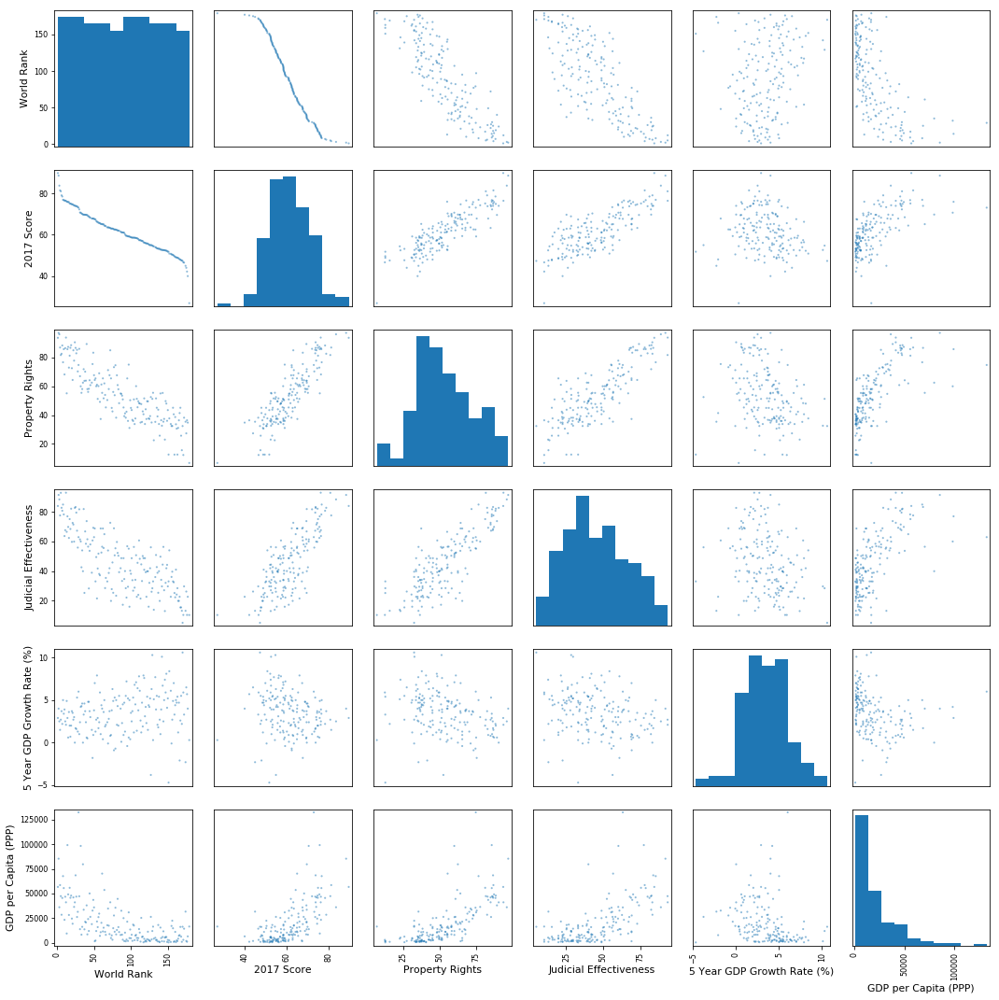

In [12]:
#econFreedomVisualization.py
# . . .
def formatted_scatter_matrix(data, pp):  
    # Create a figure showing scatterplots given in scatter_cats  
    fig_len = 15  
    fig, ax = plt.subplots(figsize = ((fig_len, fig_len)))  
    # Use fig_len to dictate fig_size, adjust size of font, size of dots, etc...  
    num_vars = len(data.keys())  
    fontsize = 65 / num_vars  
    plt.rcParams.update({'font.size': fontsize})  
    pd.plotting.scatter_matrix(data,alpha = .5, s = 108 / num_vars, ax=ax)  
    # tight layout improves layout of text and plots in the figure  
    plt.tight_layout()  
    plt.show()  
    pp.savefig(fig, bbox_inches = "tight")  
    plt.close()  
formatted_scatter_matrix(select_data, pp)
pp.close()


Exercises:
1. Find a dataset of your own choosing and import it as a dataframe using pandas. Clean the data set (i.e., drop missing values, transform non-numeric values using pd.to_numeric, etc…). Print resultant dataframe in the console.
2. Create a function that builds tables for variance, covariance, and correlation statistics for every variable in a dataframe. Use the function to create tables for a data set that you can use for a project. Save each resultant dataframe as a csv named “dataVariance.csv”, dataCovariance.csv”, and “dataCorrelation.csv”.
3.  In chapter 6 you created a series of scatter plots that integrate a 3rd variable by adjusting the color according to the value of that variable. Each of these plots is saved in a PDF. Create a function that performs these operations on all variables in a dataframe. (You may want to pass to the function a dataframe that selects from a limited number of keys in your dataset.) Be sure to pass at least two other objects to this function (e.g., fontsize, figsize, etc..). In creating this function, remove any redundancies where the two plots share the same x and y variables (i.e., if key1 is on the horizontal axis and key2 on the vertical axis with key3 being represented by color, remove any graph where key 3 remains the same but key1 and key2 are switched.) Use this function to visualize the dataset that you chose for question #1.
4. Create a function that integrates the heatmap that you have created. Include an option for changing the title, fontsize of the title. Use the function to visualize a correlation matrix of the data that you chose for question #1.
